# this notebook check the expression of a list of protein markers in the ABS population 

In [1]:
import scanpy as sc 
import numpy as np
import pandas as pd
import os
import sys
from matplotlib import pyplot as plt
import anndata as ad


In [2]:
import seaborn as sn

In [3]:
sys.path.append("/home/lucy/star_proto_filter/")
sys.path.append("/home/lucy/")
sys.path.append("/home/lucy/AmbientContaminationMetrics/")
#sys.path.append("/home/lucy/quality/plot_quality_score.py")


In [4]:
import zc_filter_function as zc_filter
import quality_control_function as zc_qc
import plot_quality_score as qc_plt
import zc_function as zc

## convert genes from NCBI reference to gene symbols

read in the table from paper

In [7]:
ncbi_list = pd.read_csv("./enterocyte_cytoskeleton.tsv", delimiter='\t', header = 0, index_col = None)

In [8]:
ncbi_list.head()

,description,refseq ID
0,"Actin, cytoplasmic 1",NP_031419.1
1,"Keratin, type II cytoskeletal 8",NP_112447.2
2,"Actin, aortic smooth muscle",NP_031418.1
3,Plectin*,NP_958796.2
4,"Keratin, type I cytoskeletal 19",NP_032497.1


use biopython

In [12]:
import Bio
from Bio import Entrez as enz

In [13]:
from Bio import SeqIO

In [14]:
enz.email = 'zhengyi.chen@vanderbilt.edu'

In [19]:
id_ls = ",".join(  list( ncbi_list['refseq ID'].astype(str) ) )

In [144]:
id_ls

'NP_031419.1,NP_112447.2,NP_031418.1,NP_958796.2,NP_032497.1,NP_780706.1,NP_033535.2,NP_001028382.1,NP_033536.2,NP_075745.1,NP_076331.2,NP_001171138.1,XP_003085904.1,NP_068695.1,NP_787030.2,NP_033286.2,NP_149064.1,NP_034794.2,NP_001003908.1,NP_033067.2,NP_001003667.1,NP_033948.1,nan,NP_598628.1,NP_031971.2,NP_742120.2,NP_076224.1,NP_598841.1,NP_076138.2,NP_766084.3,NP_033928.1,NP_666355.1,NP_780495.2,NP_034357.2,NP_031630.1,NP_031624.2,NP_033927.2,NP_080109.1,NP_035202.1,NP_071709.2'

In [30]:
stream = enz.efetch(db="protein", id=id_ls, rettype="gb", retmode="text")

_io.TextIOWrapper

In [32]:
#record1 = enz.read(stream)
#record2 = SeqIO.read( stream, format = 'genbank' )

In [31]:
records = list(SeqIO.parse(stream , "genbank"))

In [209]:
len( records)

39

In [34]:
#type( record)
stream.close()

In [18]:
type( record)

Bio.Entrez.Parser.DictionaryElement

In [37]:
#dir( records[0])

In [35]:
len( record2.features )

9

In [32]:
type( record2.features[0] )

Bio.SeqFeature.SeqFeature

In [36]:
dir( record2.features[8] )

['__bool__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_flip',
 '_get_ref',
 '_get_ref_db',
 '_get_strand',
 '_set_ref',
 '_set_ref_db',
 '_set_strand',
 '_shift',
 'extract',
 'id',
 'location',
 'qualifiers',
 'ref',
 'ref_db',
 'strand',
 'translate',
 'type']

In [42]:
record2.features[8].qualifiers['gene']

['Actb']

In [36]:
for s in records[0].features:
    if( s.type == 'CDS'):
        print( s.qualifiers['gene'][0] )

Actb


In [43]:
r1 = records[0]

In [45]:
r1.id

'NP_031419.1'

In [40]:
parsed_ls = []

In [46]:
parsed_id = []

In [47]:
for r in records:
    for s in r.features:
        if( s.type == 'CDS'):
            #print( s.qualifiers['gene'][0] )
            parsed_ls.append( s.qualifiers['gene'][0] )
            parsed_id.append( r.id) 
    

In [48]:
gene_dict = dict( zip ( parsed_id, parsed_ls ))

In [49]:
ncbi_list['gene_symbol'] = ['unfound' for i in range( ncbi_list.shape[0] ) ] 

In [50]:
ncbi_list['refseq ID'].iloc[0]

'NP_031419.1'

In [52]:
l = []
for i in range( ncbi_list.shape[0] ):
    if( ncbi_list['refseq ID'].iloc[i] in gene_dict.keys() ):
        l.append( gene_dict[ncbi_list['refseq ID'].iloc[i]] )
    else:
        l.append( 'unfound' )

In [53]:
l

['Actb',
 'Krt8',
 'Acta2',
 'Plec',
 'Krt19',
 'Actbl2',
 'Vil1',
 'Pls1',
 'Ezr',
 'Krt20',
 'Dsp',
 'Sptan1',
 'Hist1h2al',
 'Actn4',
 'Sptbn1',
 'Sptbn1',
 'Krt7',
 'Krt18',
 'Cltc',
 'Rdx',
 'Krt77',
 'Ctnna1',
 'unfound',
 'Eps8l3',
 'Eps8',
 'Crocc',
 'Actr3',
 'Flnb',
 'Ush1c',
 'Cobl',
 'Capzb',
 'Actr2',
 'Tprn',
 'Flna',
 'Capza2',
 'Cap1',
 'Capza1',
 'Baiap2l1',
 'Pfn1',
 'Tpm3']

In [54]:
ncbi_list['gene_symbol'] = l

In [57]:
ncbi_list.drop(index = 22, inplace= True)

In [58]:
ncbi_list

,description,refseq ID,gene_symbol
0,"Actin, cytoplasmic 1",NP_031419.1,Actb
1,"Keratin, type II cytoskeletal 8",NP_112447.2,Krt8
2,"Actin, aortic smooth muscle",NP_031418.1,Acta2
3,Plectin*,NP_958796.2,Plec
4,"Keratin, type I cytoskeletal 19",NP_032497.1,Krt19
5,β-Actin-like protein 2,NP_780706.1,Actbl2
6,Villin-1,NP_033535.2,Vil1
7,Plastin-1,NP_001028382.1,Pls1
8,Ezrin,NP_033536.2,Ezr
9,"Keratin, type I cytoskeletal 20",NP_075745.1,Krt20


## plot brush border gene expression 

In [59]:
dat = sc.read("./new_sample_10868_filtered/subsampled_combine_WT_Mut.h5ad")

In [60]:
dat.raw = dat.copy()

In [61]:
zc.normalization( dat)

AnnData object with n_obs × n_vars = 9010 × 23312
    obs: 'sample', 'cell_type', 'cytotrace', 'leiden', 'condition'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [63]:
dat.layers['full_norm'] = dat.X.copy()
dat.X = dat.layers['arcsinh'] 

### score the brush border genes and plot on all cells

In [64]:
sc.tl.score_genes( dat, gene_list= ncbi_list['gene_symbol'], ctrl_size=200, use_raw= False,  )

In [65]:
dat

AnnData object with n_obs × n_vars = 9010 × 23312
    obs: 'sample', 'cell_type', 'cytotrace', 'leiden', 'condition', 'score'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts', 'full_norm'
    obsp: 'connectivities', 'distances'

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


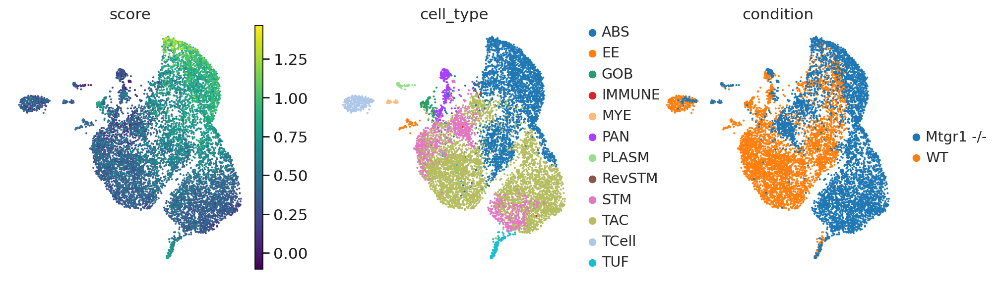

In [68]:
sc.pl.umap( dat, color = ['score', 'cell_type', 'condition'])

/tmp/ipykernel_999067/3846204699.py:2: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sn.barplot( data = dat.obs,  hue = 'condition', y = 'score', x = 'cell_type' , palette= dat.uns['condition_colors'])


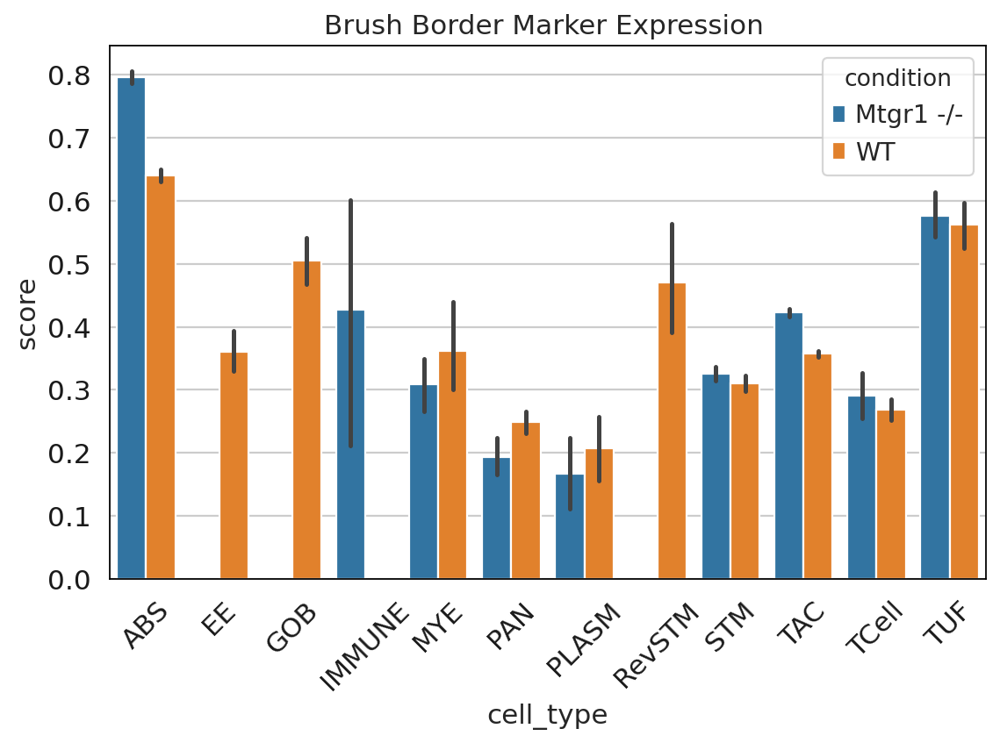

In [76]:
f,ax = plt.subplots( figsize = [8, 5 ] )
sn.barplot( data = dat.obs,  hue = 'condition', y = 'score', x = 'cell_type' , palette= dat.uns['condition_colors'])
plt.title( 'Brush Border Marker Expression ')
t = plt.xticks( rotation = 45 )

### plot on absorptive cells
- barplots and umaps

- extract ABS cells
- plot individual markers

In [77]:
ab = dat[dat.obs['cell_type'] == 'ABS' ]

In [78]:
sc.tl.umap( ab)

/home/lucy/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/lucy/.local/lib/python3.8/site-packages/scanpy/tools/_umap.py:165: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


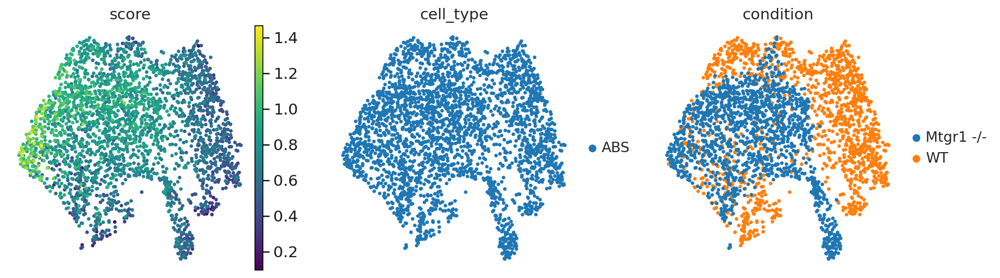

In [80]:
sc.pl.umap( ab, color =  ['score', 'cell_type', 'condition']) 

In [182]:
brush_border_genes = ncbi_list['gene_symbol']

In [183]:
brush_border_genes = brush_border_genes[np.isin( brush_border_genes, ab.var_names ) ]

In [184]:
ab

AnnData object with n_obs × n_vars = 2823 × 23312
    obs: 'sample', 'cell_type', 'cytotrace', 'leiden', 'condition', 'score'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts', 'full_norm'
    obsp: 'connectivities', 'distances'

In [185]:
#sc.pl.umap( ab, color = brush_border_genes, use_raw = False, layer = 'full_norm' )

In [186]:
len( brush_border_genes)

36

In [187]:
brush_border_df = ab.to_df( layer='full_norm')[brush_border_genes]

In [188]:
brush_border_df['condition'] = ab.obs['condition']

In [189]:
brush_border_df.head()

Genes,Actb,Krt8,Acta2,Plec,Krt19,Vil1,Pls1,Ezr,Krt20,Dsp,...,Actr2,Tprn,Flna,Capza2,Cap1,Capza1,Baiap2l1,Pfn1,Tpm3,condition
Cells,,,,,,,,,,,,,,,,,,,,,
ACACCCCCCACACCAG_10868_2,0.391066,1.289654,-0.029062,-0.530096,1.412406,-0.357841,0.337726,-0.096264,0.604365,-0.729255,...,0.723952,0.760046,-0.131613,-0.783768,0.149458,0.829531,0.078572,0.406164,0.442022,WT
CCCAACCCAGTCCCTC_10868_1,0.592335,1.182030,-0.029062,0.064573,1.086700,0.761548,0.231652,0.785402,1.036744,-0.729255,...,0.170317,-0.385948,-0.131613,-0.783768,0.641669,0.249225,-0.631095,0.518221,-0.077306,WT
AAAAACGCAACGATGT_10868_3,0.527977,0.312641,-0.029062,0.289863,0.713464,0.701616,0.784537,0.718517,0.624956,1.046755,...,0.504638,1.008704,-0.131613,-0.783768,0.308962,-0.040909,0.232555,-0.334086,-0.336953,WT
ATGGCCGCACGGAGAT_10868_3,-0.106302,1.173255,-0.029062,-0.530096,0.911766,0.384441,0.224606,0.114196,1.205517,-0.729255,...,0.565102,-0.385948,-0.131613,-0.783768,-0.585653,-0.821051,1.011843,0.451121,-1.035119,WT
ATCAAATACCATATGC_10868_2,0.496162,1.175246,-0.029062,-0.530096,1.069998,0.979111,0.584713,-0.974005,1.136336,0.375710,...,-0.850769,1.745988,-0.131613,-0.783768,2.374066,-0.821051,-0.631095,0.165057,0.767364,WT


In [190]:
print( brush_border_genes.shape)
brush_border_genes.drop_duplicates( inplace= True)
print( brush_border_genes.shape)

(36,)
(35,)


In [191]:
brush_border_df = brush_border_df.loc[:, ~ brush_border_df.columns.duplicated() ]

In [192]:
brush_border_df['Sptbn1']

Cells
ACACCCCCCACACCAG_10868_2   -0.781970
CCCAACCCAGTCCCTC_10868_1   -0.208773
AAAAACGCAACGATGT_10868_3    0.657328
ATGGCCGCACGGAGAT_10868_3   -0.781970
ATCAAATACCATATGC_10868_2    1.258516
                              ...   
AACGACCTATCACCAC_10868_5    3.163664
ATGGATCCATGAATCT_10868_5   -0.781970
AGCTATAACCCGCAGC_10868_5   -0.781970
ACCTACCCATTCAGCC_10868_5   -0.781970
ATCGCCCTAACTAAGG_10868_5   -0.781970
Name: Sptbn1, Length: 2823, dtype: float32

In [193]:
brush_border_df

Genes,Actb,Krt8,Acta2,Plec,Krt19,Vil1,Pls1,Ezr,Krt20,Dsp,...,Actr2,Tprn,Flna,Capza2,Cap1,Capza1,Baiap2l1,Pfn1,Tpm3,condition
Cells,,,,,,,,,,,,,,,,,,,,,
ACACCCCCCACACCAG_10868_2,0.391066,1.289654,-0.029062,-0.530096,1.412406,-0.357841,0.337726,-0.096264,0.604365,-0.729255,...,0.723952,0.760046,-0.131613,-0.783768,0.149458,0.829531,0.078572,0.406164,0.442022,WT
CCCAACCCAGTCCCTC_10868_1,0.592335,1.182030,-0.029062,0.064573,1.086700,0.761548,0.231652,0.785402,1.036744,-0.729255,...,0.170317,-0.385948,-0.131613,-0.783768,0.641669,0.249225,-0.631095,0.518221,-0.077306,WT
AAAAACGCAACGATGT_10868_3,0.527977,0.312641,-0.029062,0.289863,0.713464,0.701616,0.784537,0.718517,0.624956,1.046755,...,0.504638,1.008704,-0.131613,-0.783768,0.308962,-0.040909,0.232555,-0.334086,-0.336953,WT
ATGGCCGCACGGAGAT_10868_3,-0.106302,1.173255,-0.029062,-0.530096,0.911766,0.384441,0.224606,0.114196,1.205517,-0.729255,...,0.565102,-0.385948,-0.131613,-0.783768,-0.585653,-0.821051,1.011843,0.451121,-1.035119,WT
ATCAAATACCATATGC_10868_2,0.496162,1.175246,-0.029062,-0.530096,1.069998,0.979111,0.584713,-0.974005,1.136336,0.375710,...,-0.850769,1.745988,-0.131613,-0.783768,2.374066,-0.821051,-0.631095,0.165057,0.767364,WT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AACGACCTATCACCAC_10868_5,1.234530,0.805478,-0.029062,-0.530096,0.837874,-1.104725,-0.783662,-0.974005,2.389216,-0.729255,...,-0.850769,-0.385948,-0.131613,-0.783768,-0.585653,-0.821051,-0.631095,1.097196,-1.035119,Mtgr1 -/-
ATGGATCCATGAATCT_10868_5,2.285742,0.135637,-0.029062,-0.530096,0.266004,3.558654,1.866953,-0.974005,-0.732498,-0.729255,...,-0.850769,-0.385948,-0.131613,-0.783768,-0.585653,3.080416,-0.631095,-2.335551,-1.035119,Mtgr1 -/-
AGCTATAACCCGCAGC_10868_5,-0.002153,0.142104,-0.029062,-0.530096,-1.831038,-1.104725,-0.783662,1.894277,-0.732498,-0.729255,...,2.881187,-0.385948,-0.131613,-0.783768,-0.585653,-0.821051,-0.631095,0.368759,-1.035119,Mtgr1 -/-


In [194]:
brush_border_df['condition'] = ab.obs['condition']

In [196]:
# for g in brush_border_genes:
#     sn.barplot( data = brush_border_df,  x = 'condition', y = g, )
#     plt.show()

scale the values and plot bar plot

In [197]:
scaled_brush_df = brush_border_df.copy()

In [198]:
for g in brush_border_genes:
    scaled_brush_df = zc.scale_column( scaled_brush_df, g, 'scaled_'+ g)

In [199]:
scaled_brush_df.columns

Index(['Actb', 'Krt8', 'Acta2', 'Plec', 'Krt19', 'Vil1', 'Pls1', 'Ezr',
       'Krt20', 'Dsp', 'Sptan1', 'Actn4', 'Sptbn1', 'Krt7', 'Krt18', 'Cltc',
       'Rdx', 'Ctnna1', 'Eps8l3', 'Eps8', 'Crocc', 'Actr3', 'Flnb', 'Ush1c',
       'Cobl', 'Capzb', 'Actr2', 'Tprn', 'Flna', 'Capza2', 'Cap1', 'Capza1',
       'Baiap2l1', 'Pfn1', 'Tpm3', 'condition', 'scaled_Actb', 'scaled_Krt8',
       'scaled_Acta2', 'scaled_Plec', 'scaled_Krt19', 'scaled_Vil1',
       'scaled_Pls1', 'scaled_Ezr', 'scaled_Krt20', 'scaled_Dsp',
       'scaled_Sptan1', 'scaled_Actn4', 'scaled_Sptbn1', 'scaled_Krt7',
       'scaled_Krt18', 'scaled_Cltc', 'scaled_Rdx', 'scaled_Ctnna1',
       'scaled_Eps8l3', 'scaled_Eps8', 'scaled_Crocc', 'scaled_Actr3',
       'scaled_Flnb', 'scaled_Ush1c', 'scaled_Cobl', 'scaled_Capzb',
       'scaled_Actr2', 'scaled_Tprn', 'scaled_Flna', 'scaled_Capza2',
       'scaled_Cap1', 'scaled_Capza1', 'scaled_Baiap2l1', 'scaled_Pfn1',
       'scaled_Tpm3'],
      dtype='object', name='Genes')

In [200]:
scaled_brush_df = scaled_brush_df.loc[:,scaled_brush_df.columns.str.startswith('scaled')] 

In [201]:
scaled_brush_df['condition'] = brush_border_df['condition'] 

In [122]:
scaled_brush_df.columns

Index(['scaled_Actb', 'scaled_Krt8', 'scaled_Acta2', 'scaled_Plec',
       'scaled_Krt19', 'scaled_Vil1', 'scaled_Pls1', 'scaled_Ezr',
       'scaled_Krt20', 'scaled_Dsp', 'scaled_Sptan1', 'scaled_Actn4',
       'scaled_Sptbn1', 'scaled_Krt7', 'scaled_Krt18', 'scaled_Cltc',
       'scaled_Rdx', 'scaled_Ctnna1', 'scaled_Eps8l3', 'scaled_Eps8',
       'scaled_Crocc', 'scaled_Actr3', 'scaled_Flnb', 'scaled_Ush1c',
       'scaled_Cobl', 'scaled_Capzb', 'scaled_Actr2', 'scaled_Tprn',
       'scaled_Flna', 'scaled_Capza2', 'scaled_Cap1', 'scaled_Capza1',
       'scaled_Baiap2l1', 'scaled_Pfn1', 'scaled_Tpm3', 'condition'],
      dtype='object', name='Genes')

In [137]:
brush_border_df

Genes,Actb,Krt8,Acta2,Plec,Krt19,Vil1,Pls1,Ezr,Krt20,Dsp,...,Actr2,Tprn,Flna,Capza2,Cap1,Capza1,Baiap2l1,Pfn1,Tpm3,condition
Cells,,,,,,,,,,,,,,,,,,,,,
ACACCCCCCACACCAG_10868_2,0.391066,1.289654,-0.029062,-0.530096,1.412406,-0.357841,0.337726,-0.096264,0.604365,-0.729255,...,0.723952,0.760046,-0.131613,-0.783768,0.149458,0.829531,0.078572,0.406164,0.442022,WT
CCCAACCCAGTCCCTC_10868_1,0.592335,1.182030,-0.029062,0.064573,1.086700,0.761548,0.231652,0.785402,1.036744,-0.729255,...,0.170317,-0.385948,-0.131613,-0.783768,0.641669,0.249225,-0.631095,0.518221,-0.077306,WT
AAAAACGCAACGATGT_10868_3,0.527977,0.312641,-0.029062,0.289863,0.713464,0.701616,0.784537,0.718517,0.624956,1.046755,...,0.504638,1.008704,-0.131613,-0.783768,0.308962,-0.040909,0.232555,-0.334086,-0.336953,WT
ATGGCCGCACGGAGAT_10868_3,-0.106302,1.173255,-0.029062,-0.530096,0.911766,0.384441,0.224606,0.114196,1.205517,-0.729255,...,0.565102,-0.385948,-0.131613,-0.783768,-0.585653,-0.821051,1.011843,0.451121,-1.035119,WT
ATCAAATACCATATGC_10868_2,0.496162,1.175246,-0.029062,-0.530096,1.069998,0.979111,0.584713,-0.974005,1.136336,0.375710,...,-0.850769,1.745988,-0.131613,-0.783768,2.374066,-0.821051,-0.631095,0.165057,0.767364,WT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AACGACCTATCACCAC_10868_5,1.234530,0.805478,-0.029062,-0.530096,0.837874,-1.104725,-0.783662,-0.974005,2.389216,-0.729255,...,-0.850769,-0.385948,-0.131613,-0.783768,-0.585653,-0.821051,-0.631095,1.097196,-1.035119,Mtgr1 -/-
ATGGATCCATGAATCT_10868_5,2.285742,0.135637,-0.029062,-0.530096,0.266004,3.558654,1.866953,-0.974005,-0.732498,-0.729255,...,-0.850769,-0.385948,-0.131613,-0.783768,-0.585653,3.080416,-0.631095,-2.335551,-1.035119,Mtgr1 -/-
AGCTATAACCCGCAGC_10868_5,-0.002153,0.142104,-0.029062,-0.530096,-1.831038,-1.104725,-0.783662,1.894277,-0.732498,-0.729255,...,2.881187,-0.385948,-0.131613,-0.783768,-0.585653,-0.821051,-0.631095,0.368759,-1.035119,Mtgr1 -/-


In [141]:
#print( dict( zip(scaled_brush_df.columns, brush_border_df.columns)))

#### the barplot panels

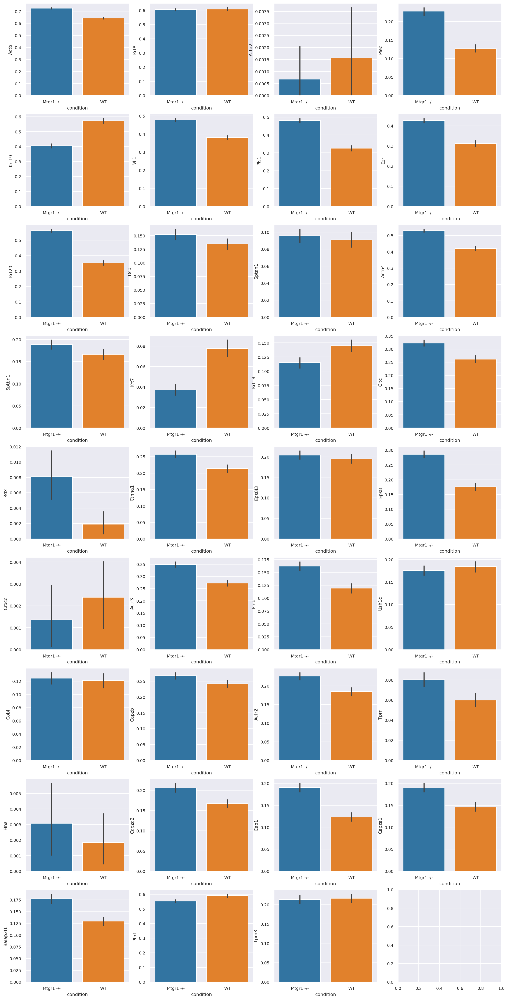

In [143]:
f,axs = plt.subplots( nrows=9, ncols=4, figsize = [18, 38])
sn.set(font_scale=1)

axs = axs.ravel()
for i in range( scaled_brush_df.shape[1]-1 ):
    c = scaled_brush_df.columns[i]
    
    sn.barplot( data = scaled_brush_df,  x = 'condition', y = c, 
               palette=list( ab.uns['condition_colors']), hue = 'condition',
              ax = axs[i])
    axs[i].set( ylabel= brush_border_df.columns[i])




### check expression of the cytoskeleton markers in WT cells to see which are in differentiated cells
- compare expression between stem cells and enterocytes

In [146]:
brush_border_genes

0         Actb
1         Krt8
2        Acta2
3         Plec
4        Krt19
6         Vil1
7         Pls1
8          Ezr
9        Krt20
10         Dsp
11      Sptan1
13       Actn4
14      Sptbn1
16        Krt7
17       Krt18
18        Cltc
19         Rdx
21      Ctnna1
23      Eps8l3
24        Eps8
25       Crocc
26       Actr3
27        Flnb
28       Ush1c
29        Cobl
30       Capzb
31       Actr2
32        Tprn
33        Flna
34      Capza2
35        Cap1
36      Capza1
37    Baiap2l1
38        Pfn1
39        Tpm3
Name: gene_symbol, dtype: object

In [149]:
dat.X.sum(axis = 1)

array([2749.6514, 1848.8226, 3086.0686, ..., 1609.4166, 1397.0627,
       1657.1997], dtype=float32)

In [150]:
dat.X = dat.raw.X

In [151]:
wt = dat[ dat.obs['condition'] == 'WT' ]

In [152]:
wt.raw = wt.copy()

In [153]:
zc.normalization( wt)

AnnData object with n_obs × n_vars = 4505 × 23312
    obs: 'sample', 'cell_type', 'cytotrace', 'leiden', 'condition', 'score'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts', 'full_norm'
    obsp: 'connectivities', 'distances'

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


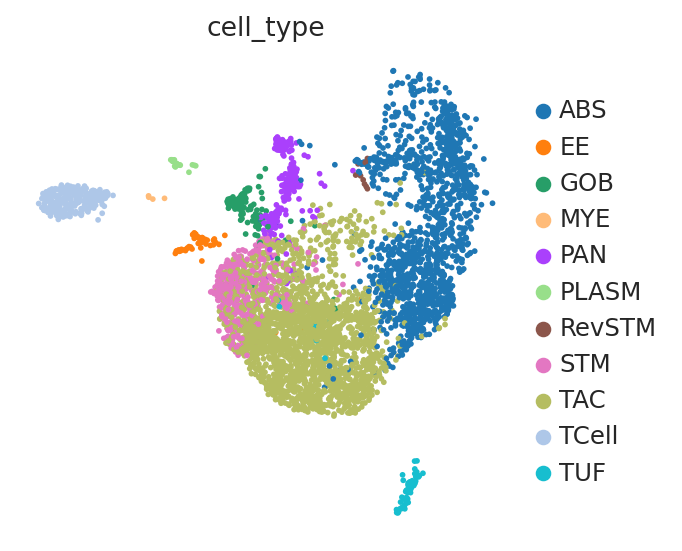

In [155]:
sc.pl.umap( wt, color = ['cell_type'] )

In [156]:
zc.clustering( wt)

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


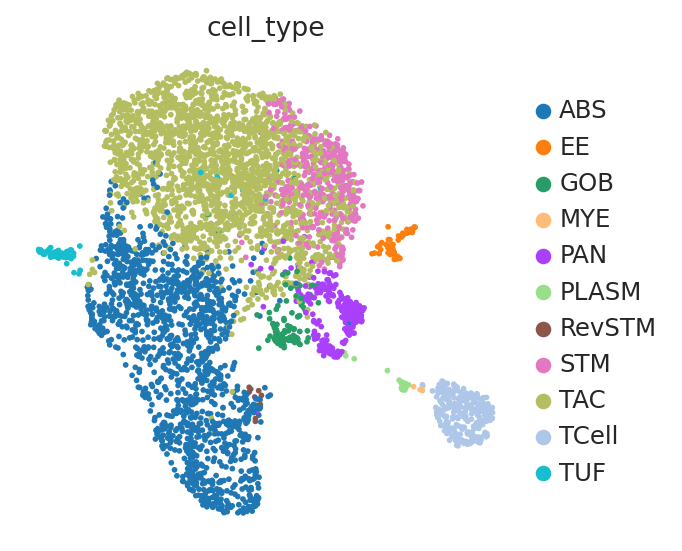

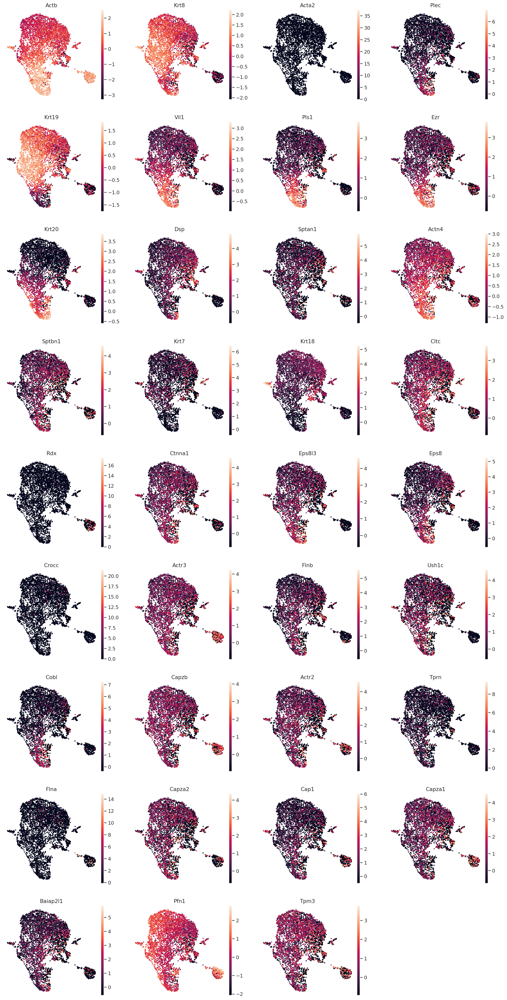

In [158]:
sc.pl.umap( wt, color = ['cell_type'] )
sc.pl.umap( wt, color = brush_border_genes, ncols = 4, use_raw = False )

In [160]:
'Cdhr5' in wt.var_names

True

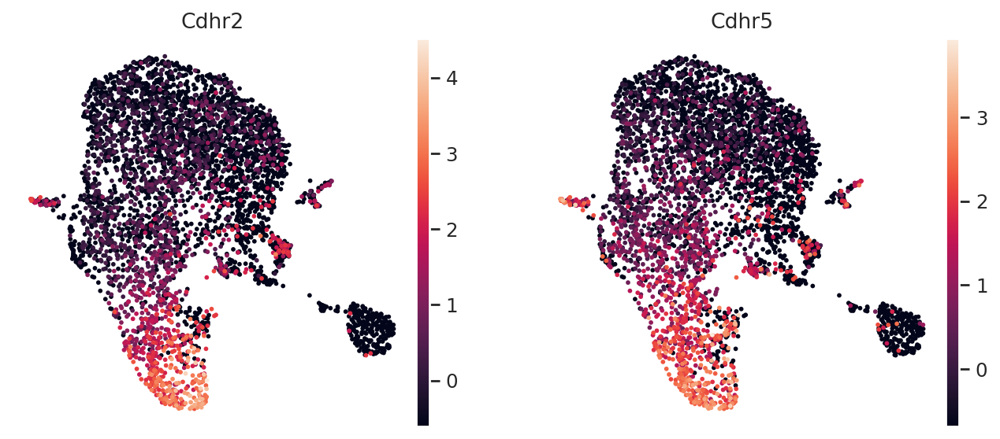

In [161]:
sc.pl.umap( wt, color = ['Cdhr2', 'Cdhr5'], use_raw = False)

In [164]:
print( list( brush_border_genes) )

['Actb', 'Krt8', 'Acta2', 'Plec', 'Krt19', 'Vil1', 'Pls1', 'Ezr', 'Krt20', 'Dsp', 'Sptan1', 'Actn4', 'Sptbn1', 'Krt7', 'Krt18', 'Cltc', 'Rdx', 'Ctnna1', 'Eps8l3', 'Eps8', 'Crocc', 'Actr3', 'Flnb', 'Ush1c', 'Cobl', 'Capzb', 'Actr2', 'Tprn', 'Flna', 'Capza2', 'Cap1', 'Capza1', 'Baiap2l1', 'Pfn1', 'Tpm3']


#### extracting true brush border genes 
- selected by Ken

In [165]:
new_brush_genes = ['Actb',  'Plec', 
                    'Vil1', 'Pls1', 'Ezr', 
                   'Krt20', 'Dsp', 'Sptan1', 'Actn4', 
                   'Sptbn1',  'Cltc', 
                   'Ctnna1', 'Eps8l3', 'Eps8', 
                    'Actr3', 'Flnb', 
                   'Cobl',  'Tprn', 
                    'Cap1', 
                   'Baiap2l1', 
                  'Cdhr2', 'Cdhr5']


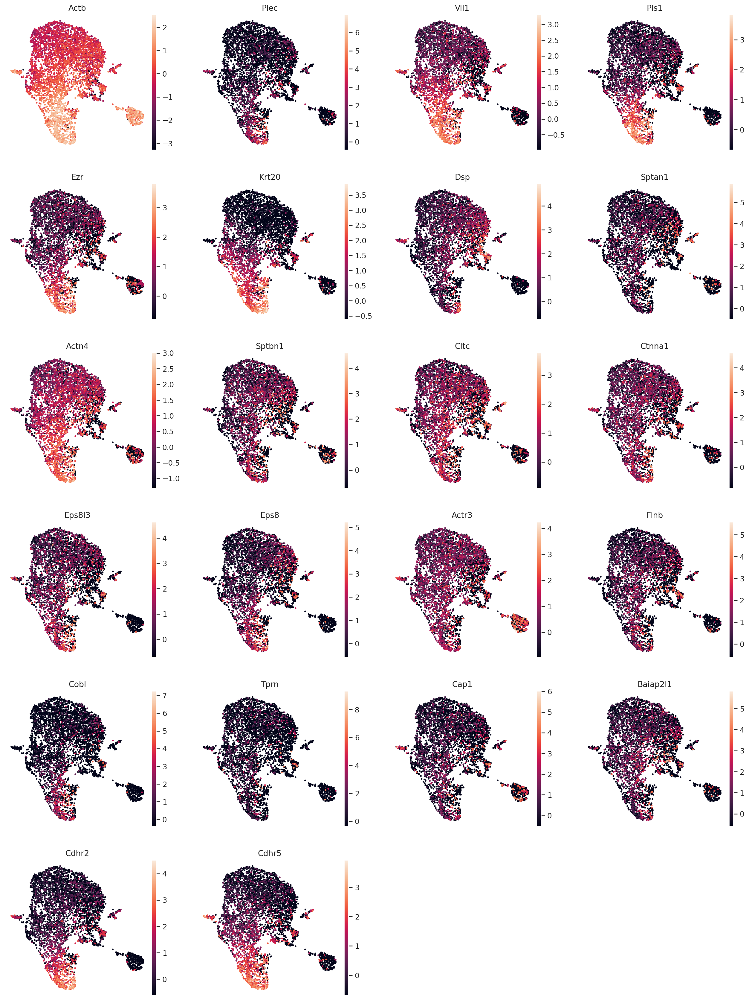

In [166]:
sc.pl.umap( wt, color = new_brush_genes, use_raw = False, ncols = 4)

In [167]:
wt.X.sum(axis = 1)

array([2074.9395 , -800.94995,  206.00204, ...,  787.8511 ,  236.4704 ,
        321.68472], dtype=float32)

In [177]:
dat.X.sum(axis = 1)

array([ 2377.,  1005., 12946., ...,   887.,   885.,   883.], dtype=float32)

In [202]:
brush_border_df[['Cdhr2', 'Cdhr5']] = ab.to_df( layer = 'full_norm')[['Cdhr2', 'Cdhr5']]

In [203]:
for cdh in ['Cdhr2', 'Cdhr5']:
    brush_border_df = zc.scale_column( brush_border_df, cdh, 'scaled_'+cdh )
    

In [204]:
brush_border_df.columns[-2: brush_border_df.shape[1] ]

Index(['scaled_Cdhr2', 'scaled_Cdhr5'], dtype='object', name='Genes')

In [205]:
scaled_brush_df.head()

Genes,scaled_Actb,scaled_Krt8,scaled_Acta2,scaled_Plec,scaled_Krt19,scaled_Vil1,scaled_Pls1,scaled_Ezr,scaled_Krt20,scaled_Dsp,...,scaled_Actr2,scaled_Tprn,scaled_Flna,scaled_Capza2,scaled_Cap1,scaled_Capza1,scaled_Baiap2l1,scaled_Pfn1,scaled_Tpm3,condition
Cells,,,,,,,,,,,,,,,,,,,,,
ACACCCCCCACACCAG_10868_2,0.612268,0.792180,0.0,0.00000,0.879476,0.160159,0.274834,0.200795,0.343391,0.000000,...,0.307216,0.126162,0.0,0.0,0.134074,0.327782,0.116179,0.651738,0.315688,WT
CCCAACCCAGTCCCTC_10868_1,0.646628,0.768565,0.0,0.09315,0.791160,0.400198,0.248837,0.402488,0.454453,0.000000,...,0.199206,0.000000,0.0,0.0,0.223846,0.212542,0.000000,0.678376,0.204700,WT
AAAAACGCAACGATGT_10868_3,0.635641,0.577803,0.0,0.12844,0.689955,0.387346,0.384340,0.387187,0.348680,0.321315,...,0.264430,0.153536,0.0,0.0,0.163165,0.154925,0.141387,0.475772,0.149209,WT
ATGGCCGCACGGAGAT_10868_3,0.527359,0.766640,0.0,0.00000,0.743725,0.319332,0.247110,0.248941,0.497805,0.000000,...,0.276226,0.000000,0.0,0.0,0.000000,0.000000,0.268964,0.662425,0.000000,WT
ATCAAATACCATATGC_10868_2,0.630210,0.767076,0.0,0.00000,0.786631,0.446851,0.335366,0.000000,0.480035,0.199910,...,0.000000,0.234703,0.0,0.0,0.539810,0.000000,0.000000,0.594424,0.385219,WT


In [206]:
scaled_brush_df[ ['scaled_Cdhr2', 'scaled_Cdhr5'] ] = brush_border_df[ ['scaled_Cdhr2', 'scaled_Cdhr5'] ] 

new barplots

In [207]:
len( new_brush_genes)

22

### barplots of new brush border genes

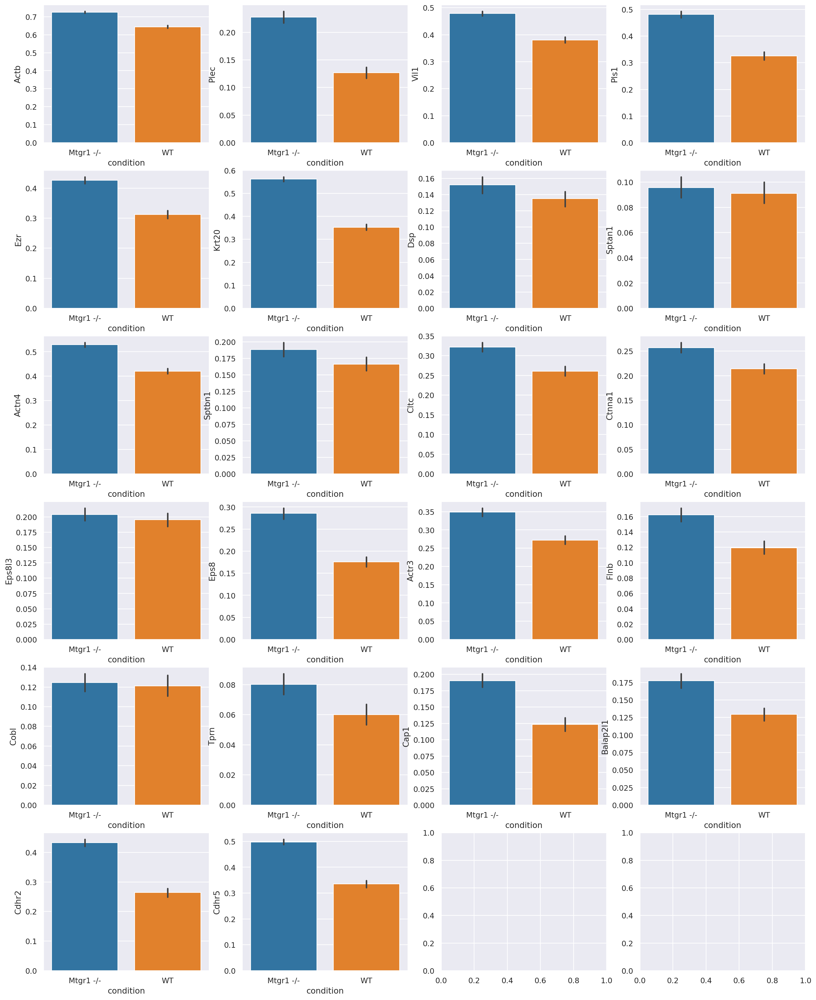

In [208]:
f,axs = plt.subplots( nrows=6, ncols=4, figsize = [20, 26])
sn.set(font_scale=1)

axs = axs.ravel()
for i in range( len( new_brush_genes) ):
    c = new_brush_genes[i]
    
    sn.barplot( data = scaled_brush_df,  x = 'condition', y = 'scaled_'+c, 
               palette=list( ab.uns['condition_colors']), hue = 'condition',
              ax = axs[i])
    axs[i].set( ylabel= c)


### violin plots of new brush border genes

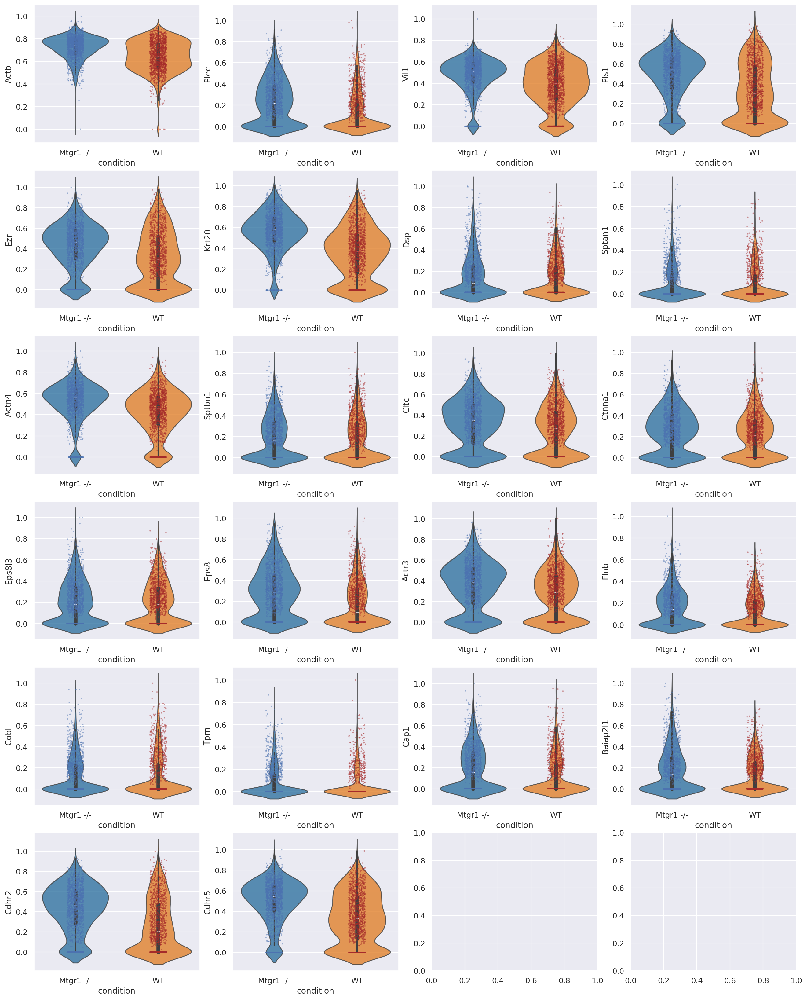

In [223]:
f,axs = plt.subplots( nrows=6, ncols=4, figsize = [20, 26])
sn.set(font_scale=1)

axs = axs.ravel()
for i in range( len( new_brush_genes) ):
    c = new_brush_genes[i]
    
    sn.violinplot( data = scaled_brush_df,  x = 'condition', y = 'scaled_'+c, 
               palette=list( ab.uns['condition_colors']), hue = 'condition',
              ax = axs[i], alpha = 0.8)
    sn.stripplot( data = scaled_brush_df,  x = 'condition', y = 'scaled_'+c, 
              palette = ['b', 'brown'], hue = 'condition',
              ax = axs[i], size = 2, alpha = 0.5)
    axs[i].set( ylabel= c)


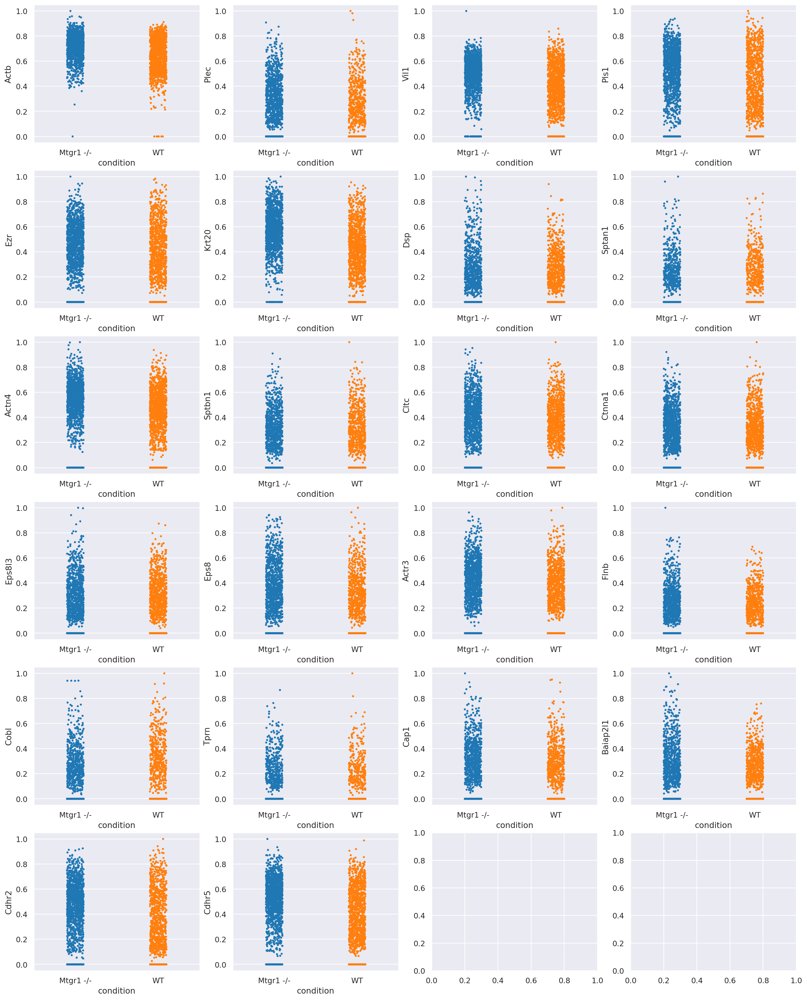

In [213]:
f,axs = plt.subplots( nrows=6, ncols=4, figsize = [20, 26])
sn.set(font_scale=1)

axs = axs.ravel()
for i in range( len( new_brush_genes) ):
    c = new_brush_genes[i]
    
    sn.stripplot( data = scaled_brush_df,  x = 'condition', y = 'scaled_'+c, 
               palette=list( ab.uns['condition_colors']), hue = 'condition',
              ax = axs[i], size = 3)
    axs[i].set( ylabel= c)


### make gene score for the true brush border genes

In [224]:
ab

AnnData object with n_obs × n_vars = 2823 × 23312
    obs: 'sample', 'cell_type', 'cytotrace', 'leiden', 'condition', 'score'
    var: 'mean', 'std'
    uns: 'cell_type_colors', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'arcsinh', 'raw_counts', 'full_norm'
    obsp: 'connectivities', 'distances'

In [227]:
ab.X = ab.layers['arcsinh']

In [228]:
sc.tl.score_genes( ab, gene_list= new_brush_genes, ctrl_size=200, use_raw= False,  score_name= 'brush_border')

/home/lucy/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


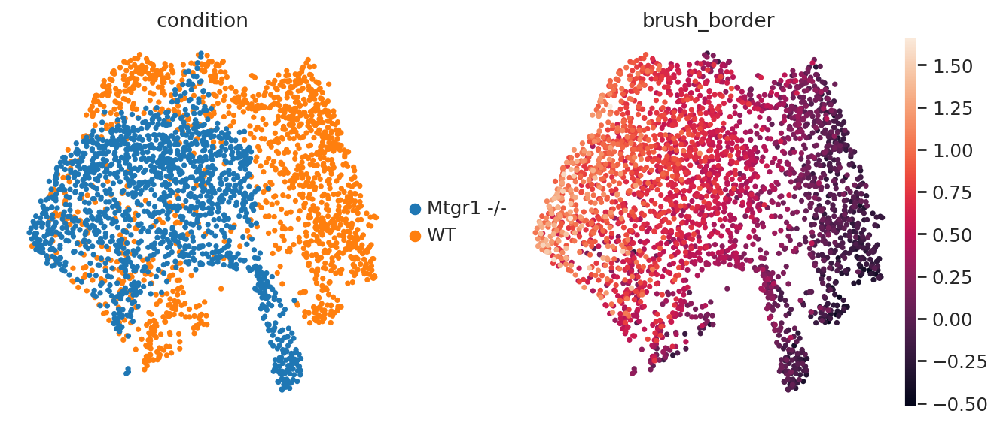

In [230]:
sc.pl.umap( ab, color = ['condition', 'brush_border'])

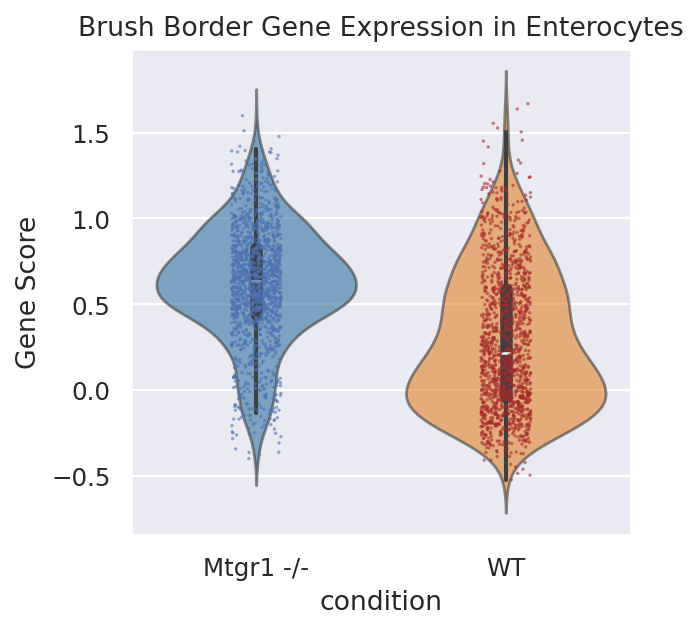

In [237]:
f,ax1 = plt.subplots()
sn.violinplot( data = ab.obs,  x = 'condition', y = 'brush_border', 
               palette=list( ab.uns['condition_colors']), hue = 'condition',
              ax = ax1, alpha = 0.6)
sn.stripplot( data = ab.obs,  x = 'condition', y = 'brush_border', 
              palette = ['b', 'brown'], hue = 'condition',
              ax = ax1, size = 1.5, alpha = 0.6)
t = ax1.set_title("Brush Border Gene Expression in Enterocytes")
t= ax1.set_ylabel("Gene Score")

## save data

In [239]:
pd.Series( new_brush_genes).to_csv("./selected_brush_border_genes.csv", header = False, index= False )